# Modelling

## Import necessary libraries

In [40]:
# For data exploration and visualization
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# For modelling
from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score,roc_auc_score,confusion_matrix,classification_report
from sklearn.metrics import precision_recall_curve,roc_curve,RocCurveDisplay,ConfusionMatrixDisplay
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.model_selection import RandomizedSearchCV,GridSearchCV
from catboost import CatBoostClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
import warnings

## Load the data

In [2]:
df = pd.read_csv('data.csv',sep=';')

In [3]:
df.head()

,Marital status,Application mode,Application order,Course,Daytime/evening attendance\t,Previous qualification,Previous qualification (grade),Nacionality,Mother's qualification,Father's qualification,...,Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target
0,1,17,5,171,1,1,122.0,1,19,12,...,0,0,0,0,0.000000,0,10.8,1.4,1.74,Dropout
1,1,15,1,9254,1,1,160.0,1,1,3,...,0,6,6,6,13.666667,0,13.9,-0.3,0.79,Graduate
2,1,1,5,9070,1,1,122.0,1,37,37,...,0,6,0,0,0.000000,0,10.8,1.4,1.74,Dropout
3,1,17,2,9773,1,1,122.0,1,38,37,...,0,6,10,5,12.400000,0,9.4,-0.8,-3.12,Graduate
4,2,39,1,8014,0,1,100.0,1,37,38,...,0,6,6,6,13.000000,0,13.9,-0.3,0.79,Graduate


## Encode the target variable

In [4]:
df['Target'].value_counts()

Target
Graduate    2209
Dropout     1421
Enrolled     794
Name: count, dtype: int64

In [5]:
df['Target'].value_counts(normalize=True)

Target
Graduate    0.499322
Dropout     0.321203
Enrolled    0.179476
Name: proportion, dtype: float64

In [6]:
df['Target'] = df['Target'].map({'Dropout':0,'Enrolled':1,'Graduate':2})

In [7]:
df.head()

,Marital status,Application mode,Application order,Course,Daytime/evening attendance\t,Previous qualification,Previous qualification (grade),Nacionality,Mother's qualification,Father's qualification,...,Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target
0,1,17,5,171,1,1,122.0,1,19,12,...,0,0,0,0,0.000000,0,10.8,1.4,1.74,0
1,1,15,1,9254,1,1,160.0,1,1,3,...,0,6,6,6,13.666667,0,13.9,-0.3,0.79,2
2,1,1,5,9070,1,1,122.0,1,37,37,...,0,6,0,0,0.000000,0,10.8,1.4,1.74,0
3,1,17,2,9773,1,1,122.0,1,38,37,...,0,6,10,5,12.400000,0,9.4,-0.8,-3.12,2
4,2,39,1,8014,0,1,100.0,1,37,38,...,0,6,6,6,13.000000,0,13.9,-0.3,0.79,2


## Train test split

In [8]:
# Features
X = df.drop('Target',axis=1)
y = df['Target']

In [9]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [10]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((3539, 36), (885, 36), (3539,), (885,))

## Scaling the data

In [11]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

scaler.fit(X_train)

X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [12]:
X_train_scaled

array([[ 4.76915307, -0.67347927, -0.55749616, ..., -0.17355626,
        -0.46134859,  0.88478423],
       [-0.29476314,  1.16157067, -0.55749616, ..., -0.17355626,
        -0.46134859,  0.88478423],
       [-0.29476314, -1.01755114,  3.23669405, ..., -0.28596761,
         0.11873318,  0.76159704],
       ...,
       [-0.29476314, -1.01755114, -0.55749616, ...,  0.42597092,
         1.7864683 , -0.75184569],
       [-0.29476314, -1.01755114,  1.71901797, ..., -0.17355626,
        -0.46134859,  0.88478423],
       [-0.29476314, -0.04268086,  0.20134188, ...,  0.87561631,
        -1.1139406 ,  0.34364047]])

## Train different models

### Create an Evaluate Function to give all metrics after model Training

In [13]:
def evaluate_model(X_test,y_test,y_pred,X_train,y_train,model):
    y_pred = model.predict(X_test)
    test_accuracy = accuracy_score(y_test,y_pred)
    train_accuracy = model.score(X_train,y_train)
    precision = precision_score(y_test,y_pred,average='weighted')
    recall = recall_score(y_test,y_pred,average='weighted')
    f1 = f1_score(y_test,y_pred,average='weighted')

    return {
        'Test Accuracy': test_accuracy,
        'Train Accuracy': train_accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }


### Some machine learning algorithms don't require scaling, that's why we don't use scaled variables in these algorithms.

#### Firstly, train the models which require scaling.

In [14]:
models_scaling = {
    'Logistic Regression' : LogisticRegression(),
    'KNN Classifier' : KNeighborsClassifier(),
    'SVC' : SVC()}

In [15]:
results = []

for model_name, model in models_scaling.items():
    print(model_name)
    
    np.random.seed(42)

    model.fit(X_train_scaled, y_train)       

    y_pred = model.predict(X_test_scaled)    

    metrics = evaluate_model(X_test, y_test, y_pred,X_train_scaled,y_train,model) 
    metrics['Model'] = model_name            
    
    results.append(metrics)  

results_df = pd.DataFrame(results)

print(results_df)

Logistic Regression
KNN Classifier


c:\Users\ASUS\OneDrive - Azerbaijan State Oil and Industry University\Desktop\Education\python\ML-Project-from-YouTube\venv\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but LogisticRegression was fitted without feature names
  warnings.warn(
c:\Users\ASUS\OneDrive - Azerbaijan State Oil and Industry University\Desktop\Education\python\ML-Project-from-YouTube\venv\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\ASUS\OneDrive - Azerbaijan State Oil and Industry University\Desktop\Education\python\ML-Project-from-YouTube\venv\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(


SVC


c:\Users\ASUS\OneDrive - Azerbaijan State Oil and Industry University\Desktop\Education\python\ML-Project-from-YouTube\venv\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVC was fitted without feature names
  warnings.warn(


   Test Accuracy  Train Accuracy  Precision    Recall  F1 Score  \
0       0.357062        0.778751   0.127493  0.357062  0.187896   
1       0.459887        0.795140   0.400780  0.459887  0.350903   
2       0.472316        0.825657   0.223083  0.472316  0.303036   

                 Model  
0  Logistic Regression  
1       KNN Classifier  
2                  SVC  


c:\Users\ASUS\OneDrive - Azerbaijan State Oil and Industry University\Desktop\Education\python\ML-Project-from-YouTube\venv\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


#### Now, we train the models with data which is not scaled.

In [16]:
models = {
    'Naive Bayes': GaussianNB(),
    'Decision Tree Classifier' : DecisionTreeClassifier(),
    'Random Forest Classifier' : RandomForestClassifier(),
    'AdaBoost Classifier' : AdaBoostClassifier(),
    'CatBoost Classifier' : CatBoostClassifier(),
    'XGBoost Classifier' : XGBClassifier(),
    'LightGBM' : LGBMClassifier()
}


In [17]:
for model_name, model in models.items():
    print(model_name)

    model.fit(X_train, y_train) 

    np.random.seed(42)

    y_pred = model.predict(X_test)    


    metrics = evaluate_model(X_test, y_test, y_pred,X_train,y_train,model) 
    metrics['Model'] = model_name            
    
    results.append(metrics)  

results_df = pd.DataFrame(results)

print(results_df)

Naive Bayes
Decision Tree Classifier
Random Forest Classifier
AdaBoost Classifier


c:\Users\ASUS\OneDrive - Azerbaijan State Oil and Industry University\Desktop\Education\python\ML-Project-from-YouTube\venv\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


CatBoost Classifier
Learning rate set to 0.084395
0:	learn: 1.0298620	total: 153ms	remaining: 2m 32s
1:	learn: 0.9802399	total: 158ms	remaining: 1m 18s
2:	learn: 0.9363665	total: 163ms	remaining: 54.1s
3:	learn: 0.8990005	total: 168ms	remaining: 41.7s
4:	learn: 0.8640757	total: 173ms	remaining: 34.3s
5:	learn: 0.8337294	total: 178ms	remaining: 29.5s
6:	learn: 0.8101160	total: 184ms	remaining: 26.1s
7:	learn: 0.7872525	total: 189ms	remaining: 23.4s
8:	learn: 0.7665411	total: 194ms	remaining: 21.3s
9:	learn: 0.7472077	total: 199ms	remaining: 19.7s
10:	learn: 0.7308264	total: 203ms	remaining: 18.3s
11:	learn: 0.7186101	total: 207ms	remaining: 17.1s
12:	learn: 0.7081914	total: 212ms	remaining: 16.1s
13:	learn: 0.6965181	total: 216ms	remaining: 15.2s
14:	learn: 0.6850763	total: 221ms	remaining: 14.5s
15:	learn: 0.6735922	total: 226ms	remaining: 13.9s
16:	learn: 0.6653678	total: 231ms	remaining: 13.4s
17:	learn: 0.6565862	total: 236ms	remaining: 12.9s
18:	learn: 0.6489994	total: 240ms	remain

### Let's look at results of all the models.

In [18]:
results_df.sort_values(by='Test Accuracy',ascending=False)

,Test Accuracy,Train Accuracy,Precision,Recall,F1 Score,Model
9,0.772881,0.989545,0.761018,0.772881,0.761122,LightGBM
8,0.769492,0.999717,0.763302,0.769492,0.762844,XGBoost Classifier
7,0.768362,0.990110,0.760669,0.768362,0.760243,CatBoost Classifier
5,0.760452,1.000000,0.745148,0.760452,0.744572,Random Forest Classifier
6,0.743503,0.773382,0.722002,0.743503,0.726957,AdaBoost Classifier
3,0.699435,0.695677,0.687721,0.699435,0.686834,Naive Bayes
4,0.676836,1.000000,0.685169,0.676836,0.679423,Decision Tree Classifier
2,0.472316,0.825657,0.223083,0.472316,0.303036,SVC
1,0.459887,0.795140,0.400780,0.459887,0.350903,KNN Classifier
0,0.357062,0.778751,0.127493,0.357062,0.187896,Logistic Regression


## Hyperparameter Tuning

Let's implement hyperparameter tuning for top 5 models.

### LightGBM

In [19]:
from scipy.stats import randint, uniform

param_dist = {
    'num_leaves': randint(6, 50), 
    'n_estimators': randint(50, 500),  
    'min_child_samples': randint(20, 500), 
    'reg_alpha': uniform(0.0, 1.0),
    'reg_lambda': uniform(0.0, 1.0)
}


lgbm_rs = RandomizedSearchCV(
    estimator=LGBMClassifier(), 
    param_distributions=param_dist, 
    n_iter=100,
    scoring='accuracy', 
    cv=5, 
    verbose=1, 
    random_state=42, 
    n_jobs=-1 
)


lgbm_rs.fit(X_train, y_train)


print("Best parameters found: ", lgbm_rs.best_params_)


Fitting 5 folds for each of 100 candidates, totalling 500 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002473 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1265
[LightGBM] [Info] Number of data points in the train set: 3539, number of used features: 33
[LightGBM] [Info] Start training from score -1.163999
[LightGBM] [Info] Start training from score -1.705455
[LightGBM] [Info] Start training from score -0.681070
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with

In [20]:
results_hyp_tuning = []
metrics_lgbm = evaluate_model(X_test, y_test, y_pred,X_train,y_train,lgbm_rs) 
metrics_lgbm['Model'] = 'Light GBM'            
results_hyp_tuning.append(metrics_lgbm)

### XGBoost Classifier

In [21]:
param_dist = {
    'max_depth': randint(3, 10),
    'learning_rate': uniform(0.01, 0.1),
    'subsample': uniform(0.5, 0.5),
    'n_estimators': randint(50, 200)
}


xgb_model = XGBClassifier()

xgb_rs = RandomizedSearchCV(xgb_model, param_distributions=param_dist, n_iter=100, cv=5, scoring='accuracy',n_jobs=-1)

xgb_rs.fit(X_train, y_train)

print("Best set of hyperparameters: ", xgb_rs.best_params_)
print("Best score: ", xgb_rs.best_score_)

Best set of hyperparameters:  {'learning_rate': 0.09154614284548342, 'max_depth': 3, 'n_estimators': 185, 'subsample': 0.8645035840204937}
Best score:  0.7849683152334604


In [22]:
metrics_xgb = evaluate_model(X_test,y_test, y_pred,X_train,y_train,xgb_rs) 
metrics_xgb['Model'] = 'XGBoost Classifier'            
results_hyp_tuning.append(metrics_xgb)

### CatBoost Classifier

In [23]:
param_dist = {
    'iterations': randint(100, 1000),            
    'learning_rate': uniform(0.01, 0.3),  
    'depth': randint(3, 10),                       
    'l2_leaf_reg': uniform(1, 10)
}

cat_model = CatBoostClassifier()

cat_rs = RandomizedSearchCV(cat_model, param_distributions=param_dist, n_iter=50, cv=5, scoring='accuracy',n_jobs=-1)

cat_rs.fit(X_train, y_train)

print("Best set of hyperparameters: ", cat_rs.best_params_)
print("Best score: ", cat_rs.best_score_)

0:	learn: 0.9968361	total: 5ms	remaining: 4.61s
1:	learn: 0.9281632	total: 9.4ms	remaining: 4.33s
2:	learn: 0.8726228	total: 12.3ms	remaining: 3.77s
3:	learn: 0.8336520	total: 16.3ms	remaining: 3.74s
4:	learn: 0.8042332	total: 20.1ms	remaining: 3.68s
5:	learn: 0.7753311	total: 23ms	remaining: 3.52s
6:	learn: 0.7520059	total: 26.3ms	remaining: 3.44s
7:	learn: 0.7317438	total: 29.8ms	remaining: 3.41s
8:	learn: 0.7143501	total: 33.2ms	remaining: 3.37s
9:	learn: 0.7017504	total: 36.6ms	remaining: 3.34s
10:	learn: 0.6891827	total: 39.4ms	remaining: 3.27s
11:	learn: 0.6776923	total: 42.9ms	remaining: 3.26s
12:	learn: 0.6690331	total: 46ms	remaining: 3.22s
13:	learn: 0.6642786	total: 49.4ms	remaining: 3.21s
14:	learn: 0.6569747	total: 52.5ms	remaining: 3.18s
15:	learn: 0.6505367	total: 55.6ms	remaining: 3.15s
16:	learn: 0.6449053	total: 58.4ms	remaining: 3.11s
17:	learn: 0.6402129	total: 61.4ms	remaining: 3.09s
18:	learn: 0.6348697	total: 64.6ms	remaining: 3.07s
19:	learn: 0.6297432	total: 67

In [24]:
metrics_cat = evaluate_model(X_test,y_test, y_pred,X_train,y_train,cat_rs) 
metrics_cat['Model'] = 'CatBoost Classifier'            
results_hyp_tuning.append(metrics_cat)

In [25]:
pd.DataFrame(results_hyp_tuning)

,Test Accuracy,Train Accuracy,Precision,Recall,F1 Score,Model
0,0.758192,0.854196,0.743293,0.758192,0.744770,Light GBM
1,0.763842,0.855044,0.751039,0.763842,0.751262,XGBoost Classifier
2,0.764972,0.881888,0.752307,0.764972,0.753131,CatBoost Classifier


### Random Forest Classifier

In [26]:
param_dist = {
    'n_estimators': range(10, 101),
    'criterion': ['gini', 'entropy'],
    'max_depth': range(2, 51),
    'min_samples_split': range(2, 11),
    'min_samples_leaf': range(1, 11),
    'max_features': ['sqrt', 'log2', None],
    'bootstrap': [True, False]
}

rfc_model = RandomForestClassifier()

rfc_rs = RandomizedSearchCV(rfc_model, param_distributions=param_dist, n_iter=100, cv=5, scoring='accuracy',n_jobs=-1)

rfc_rs.fit(X_train, y_train)

print("Best set of hyperparameters: ", rfc_rs.best_params_)
print("Best score: ", rfc_rs.best_score_)

Best set of hyperparameters:  {'n_estimators': 43, 'min_samples_split': 9, 'min_samples_leaf': 3, 'max_features': 'log2', 'max_depth': 26, 'criterion': 'gini', 'bootstrap': False}
Best score:  0.7798819712479723


In [27]:
metrics_rfc = evaluate_model(X_test,y_test, y_pred,X_train,y_train,rfc_rs) 
metrics_rfc['Model'] = 'Random Forest Classifier'            
results_hyp_tuning.append(metrics_rfc)

### Ada Boost Classifier

In [28]:
param_dist = {
    'n_estimators': randint(50, 500),  
    'learning_rate': uniform(0.01, 1)}

ada_model = AdaBoostClassifier()

ada_rs = RandomizedSearchCV(ada_model, param_distributions=param_dist, n_iter=100, cv=5, scoring='accuracy',n_jobs=-1)

ada_rs.fit(X_train, y_train)

print("Best set of hyperparameters: ", ada_rs.best_params_)
print("Best score: ", ada_rs.best_score_)

c:\Users\ASUS\OneDrive - Azerbaijan State Oil and Industry University\Desktop\Education\python\ML-Project-from-YouTube\venv\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Best set of hyperparameters:  {'learning_rate': 0.36609672589784625, 'n_estimators': 414}
Best score:  0.7674469989371818


In [29]:
metrics_ada = evaluate_model(X_test,y_test, y_pred,X_train,y_train,ada_rs) 
metrics_ada['Model'] = 'AdaBoost Classifier'            
results_hyp_tuning.append(metrics_ada)

In [30]:
pd.DataFrame(results_hyp_tuning)

,Test Accuracy,Train Accuracy,Precision,Recall,F1 Score,Model
0,0.758192,0.854196,0.743293,0.758192,0.744770,Light GBM
1,0.763842,0.855044,0.751039,0.763842,0.751262,XGBoost Classifier
2,0.764972,0.881888,0.752307,0.764972,0.753131,CatBoost Classifier
3,0.767232,0.962984,0.750849,0.767232,0.748011,Random Forest Classifier
4,0.749153,0.788641,0.735359,0.749153,0.738626,AdaBoost Classifier


### Feature Selection

Let's choose LightGBM model and implement different feature selection methods.

#### Recursive Feature Elimination

In [32]:
from sklearn.feature_selection import RFE
max_accuracy = 0
best_n = 0

for i in range(1, len(X_train.columns) + 1):
  lgbm_rs = LGBMClassifier(min_child_samples=195, n_estimators=88, num_leaves=34, reg_alpha=0.2965101436477985, reg_lambda=0.4197808564462765)
  best_features = RFE(estimator=lgbm_rs,n_features_to_select=i,)
  best_features.fit(X_train, y_train)
  selected_features = X_train.columns[best_features.support_]

  X_train_selected = best_features.transform(X_train)
  X_test_selected = best_features.transform(X_test)

  lgbm_rs.fit(X_train_selected, y_train)
  accuracy = lgbm_rs.score(X_test_selected, y_test)

  if accuracy > max_accuracy:
    max_accuracy = accuracy
    best_n = i

print(f"Best number of features = {best_n} with Accuracy = {max_accuracy}")

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1265
[LightGBM] [Info] Number of data points in the train set: 3539, number of used features: 33
[LightGBM] [Info] Start training from score -1.163999
[LightGBM] [Info] Start training from score -1.705455
[LightGBM] [Info] Start training from score -0.681070
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [33]:
best_features = RFE(estimator=lgbm_rs,n_features_to_select=best_n)
best_features.fit(X_train, y_train)
selected_features = X_train.columns[best_features.support_]

X_train_selected = best_features.transform(X_train)
X_test_selected = best_features.transform(X_test)

lgbm_rs.fit(X_train_selected, y_train)

print(f'Selected Features: {selected_features.values}')
print(f'Number of selected Features: {len(selected_features.values)}')
print(f'Test Accuracy: {lgbm_rs.score(X_test_selected, y_test)}')
print(f'Train Accuracy: {lgbm_rs.score(X_train_selected, y_train)}')

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001265 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1265
[LightGBM] [Info] Number of data points in the train set: 3539, number of used features: 33
[LightGBM] [Info] Start training from score -1.163999
[LightGBM] [Info] Start training from score -1.705455
[LightGBM] [Info] Start training from score -0.681070
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [34]:
print(f'Selected Features: {selected_features.values}')

Selected Features: ['Application mode' 'Application order' 'Course' 'Previous qualification'
 'Previous qualification (grade)' "Mother's qualification"
 "Father's qualification" "Mother's occupation" "Father's occupation"
 'Admission grade' 'Displaced' 'Debtor' 'Tuition fees up to date' 'Gender'
 'Scholarship holder' 'Age at enrollment'
 'Curricular units 1st sem (enrolled)'
 'Curricular units 1st sem (evaluations)'
 'Curricular units 1st sem (approved)' 'Curricular units 1st sem (grade)'
 'Curricular units 1st sem (without evaluations)'
 'Curricular units 2nd sem (credited)'
 'Curricular units 2nd sem (enrolled)'
 'Curricular units 2nd sem (evaluations)'
 'Curricular units 2nd sem (approved)' 'Curricular units 2nd sem (grade)'
 'Unemployment rate' 'Inflation rate' 'GDP']


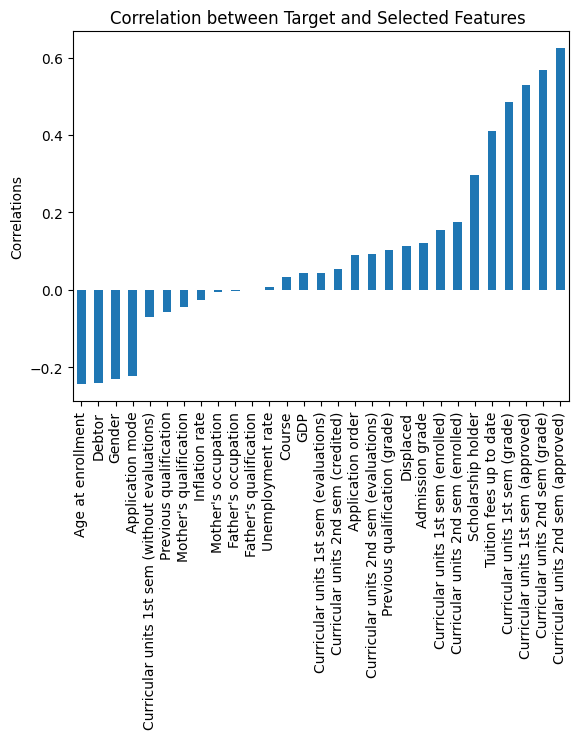

In [35]:
corr = df.corr()['Target']
corr[selected_features].sort_values().plot(kind='bar')
plt.title('Correlation between Target and Selected Features ')
plt.ylabel('Correlations')
plt.show()

### Model Evaluation

Make predictions

In [38]:
y_pred = lgbm_rs.predict(X_test[selected_features])

Classification report

Let's look at all of these metrics in one report.

In [41]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.83      0.76      0.79       316
           1       0.50      0.33      0.40       151
           2       0.78      0.93      0.84       418

    accuracy                           0.76       885
   macro avg       0.70      0.67      0.68       885
weighted avg       0.75      0.76      0.75       885



Confusion Matrix

In [42]:
confusion_matrix(y_test, y_pred)

array([[239,  28,  49],
       [ 39,  50,  62],
       [  9,  22, 387]], dtype=int64)

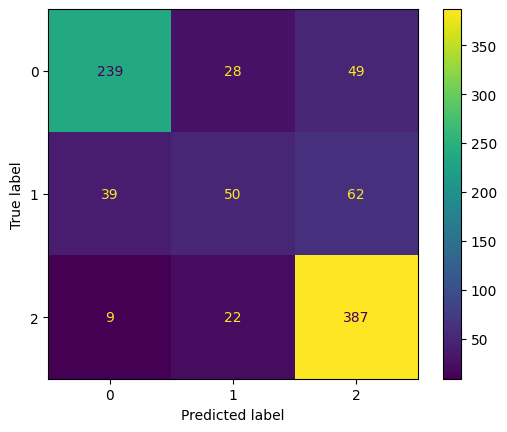

In [43]:
ConfusionMatrixDisplay.from_predictions(y_true=y_test,y_pred=y_pred)

ROC/AUC Score